In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
#drive.mount("/ShardDrives/")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from PIL import Image
from urllib.request import urlopen
from io import BytesIO
#%c\d '/content/drive/My Drive/images/'
#URL image used because there is no way to have an uploaded image stay in the notebook permanently
image_url = 'https://i.insider.com/5d8e3a002e22af72737d9fd5?width=600&format=jpeg&auto=webp'
with urlopen(image_url) as response:
  image_data = BytesIO(response.read())

original_image = Image.open(image_data)

#original_image = Image.open('group.jp2')

imgmat = np.array(original_image)

In [ ]:
print(imgmat.shape)


(338, 600, 3)


In [ ]:
def svd(A_matrix: np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
  #Create square matrix and populate with A^T A
  dimension = np.max(A_matrix.shape)
  dimension_low = np.min(A_matrix.shape)
  square = np.zeros((dimension,dimension))
  square[:A_matrix.shape[0], :A_matrix.shape[1]] = A_matrix
  square_A = square.T @ square

  #Find eigenvalues, S^2 and eigenvectors, V
  S_squared, V_vectors = np.linalg.eig(square_A)

  #Sort in descending order
  idx_A = np.argsort(S_squared)[::-1]
  S_squared, V_vectors = S_squared[idx_A], V_vectors[:, idx_A]

  S_diag = np.sqrt(S_squared[:A_matrix.shape[0]])

  #Fill in S to match A
  S = np.diag(S_diag)
  S = np.pad(S, ((0, A_matrix.shape[0] - S.shape[0]), (0, A_matrix.shape[1] - S.shape[1])))

  V_vectors /= np.abs(np.linalg.norm(V_vectors, axis=0))

  #A=USV^T => U=AVS^-1, since V^T V = I
  invsings = np.reciprocal(S_diag)
  invS = np.diag(invsings)
  invS = np.pad(invS, ((0, A_matrix.shape[1] - invS.shape[1]), (0, A_matrix.shape[0] - invS.shape[0])))
  U_vectors = square @ V_vectors @ invS

  U_vectors /= np.abs(np.linalg.norm(U_vectors, axis=0))
  U_vectors = U_vectors[:dimension_low, :dimension_low]

  return U_vectors, S, V_vectors.T

def svd_compress(image: np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray, int]:
    U, S, V = [], [], []
    decomposed_image = []
    total_size = 0

    for i in range(3):
        u_channel, s_channel, v_channel = svd(image[:,:,i]);#np.linalg.svd(image[:,:,i], full_matrices=False)
        U.append(u_channel)
        S.append(s_channel)
        V.append(v_channel)

        decomposed_image.append(np.real(U[i] @ S[i] @ V[i]))
        total_size += np.shape(u_channel)[0] * np.shape(u_channel)[1] + np.shape(v_channel)[0] * np.shape(v_channel)[1]
        #total_size += decomposed_image[i].size

    return np.transpose(U, (1, 2, 0)), np.transpose(S, (1, 2, 0)), np.transpose(V, (1, 2, 0)), np.transpose(decomposed_image, (1, 2, 0)), total_size

(338, 338, 3)
(338, 600, 3)
(600, 600, 3)


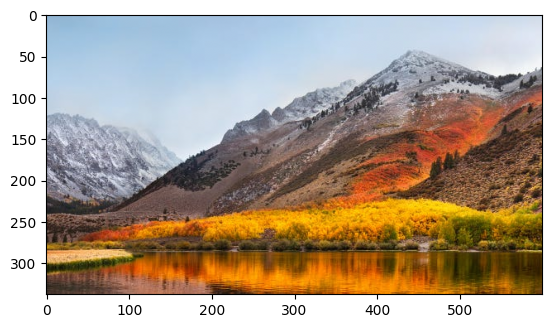

In [ ]:
#View orginal image
U,S,V, decomposed_image, total_size = svd_compress(imgmat)
print(U.shape)
print(S.shape)
print(V.shape)
norm = Normalize(vmin=0, vmax=255)
decomposed_image1 = norm(decomposed_image)
plt.imshow(decomposed_image1)

p = 2
Percent of storage memory = 0.009250493096646942
Frobenius norm: ||A - A_p|| = 13923.543105365892


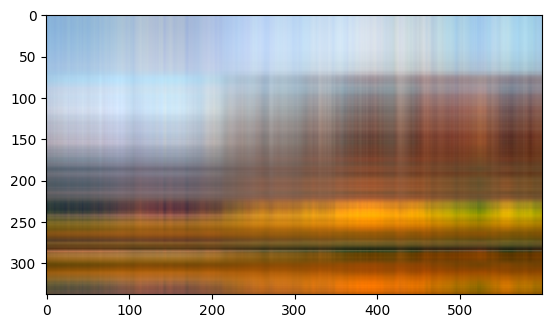

p = 12
Percent of storage memory = 0.055502958579881655
Frobenius norm: ||A - A_p|| = 8148.836559493812


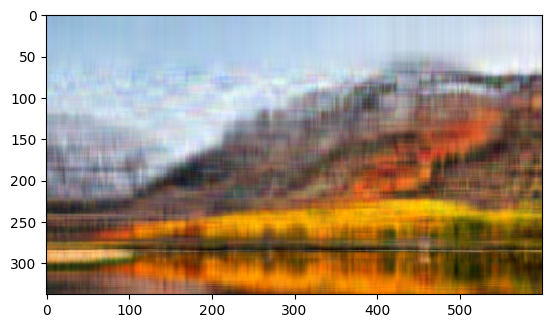

p = 22
Percent of storage memory = 0.10175542406311637
Frobenius norm: ||A - A_p|| = 6643.482196559481


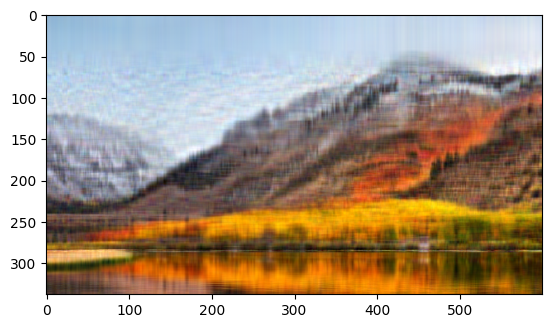

p = 32
Percent of storage memory = 0.14800788954635108
Frobenius norm: ||A - A_p|| = 5781.206319400691


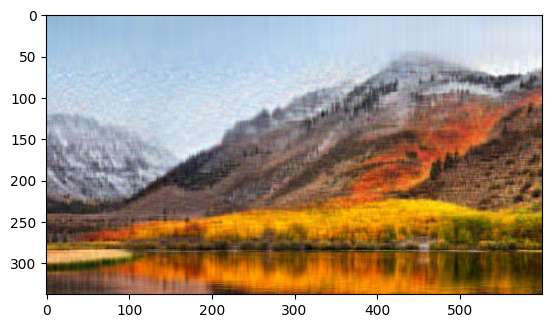

p = 42
Percent of storage memory = 0.1942603550295858
Frobenius norm: ||A - A_p|| = 5137.594252932279


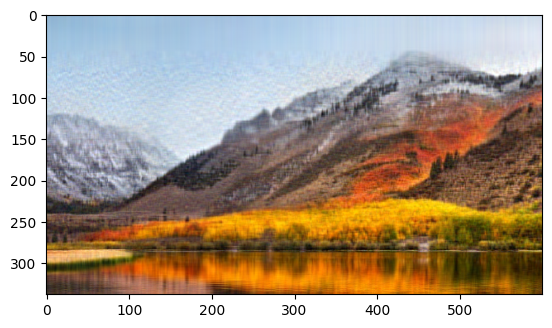

p = 52
Percent of storage memory = 0.24051282051282052
Frobenius norm: ||A - A_p|| = 4635.006783165737


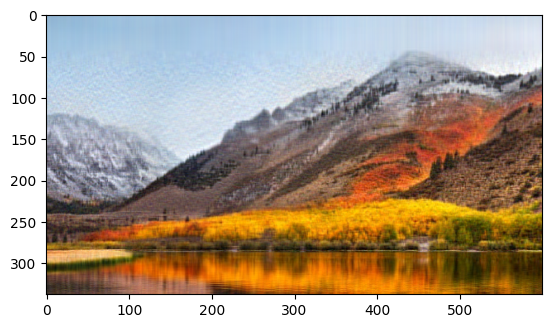

p = 62
Percent of storage memory = 0.2867652859960552
Frobenius norm: ||A - A_p|| = 4205.873989099308


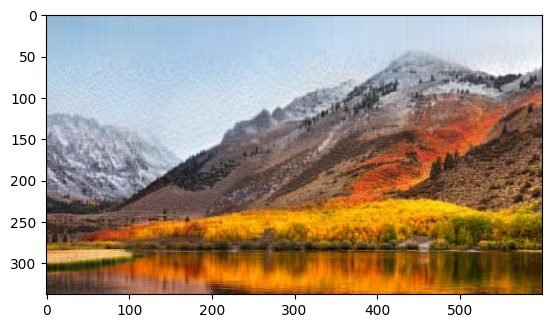

p = 72
Percent of storage memory = 0.3330177514792899
Frobenius norm: ||A - A_p|| = 3829.3823400135348


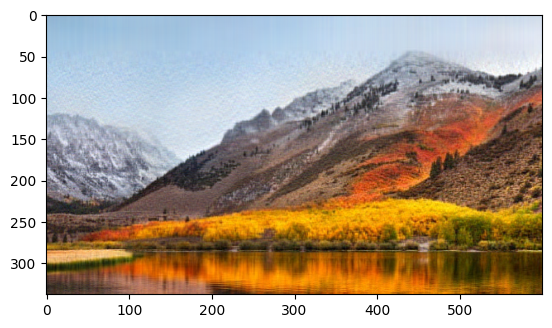

p = 82
Percent of storage memory = 0.37927021696252466
Frobenius norm: ||A - A_p|| = 3489.007597242288


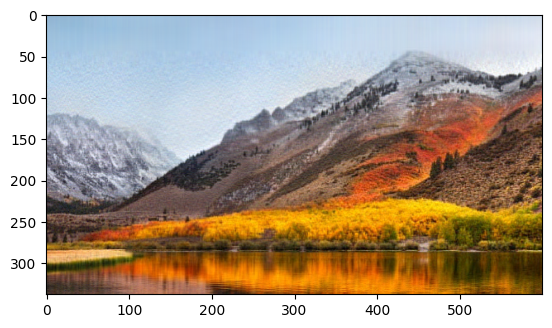

p = 92
Percent of storage memory = 0.42552268244575936
Frobenius norm: ||A - A_p|| = 3180.4133133028095


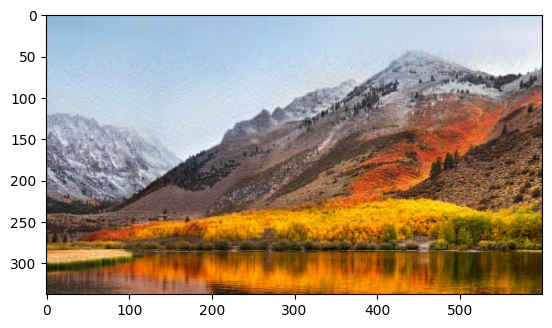

p = 102
Percent of storage memory = 0.4717751479289941
Frobenius norm: ||A - A_p|| = 2894.3520279613113


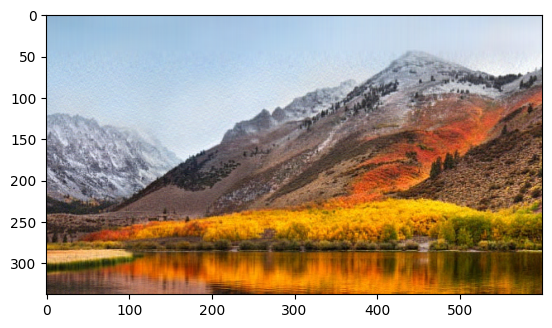

p = 112
Percent of storage memory = 0.5180276134122288
Frobenius norm: ||A - A_p|| = 2633.5150109811534


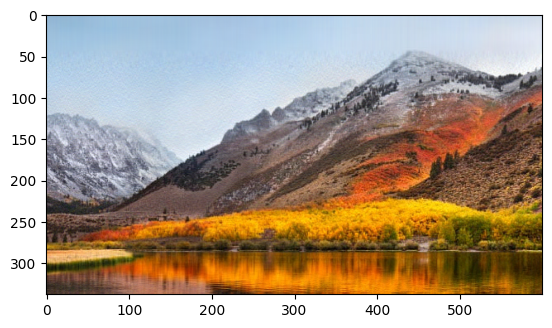

p = 122
Percent of storage memory = 0.5642800788954635
Frobenius norm: ||A - A_p|| = 2392.5363308814563


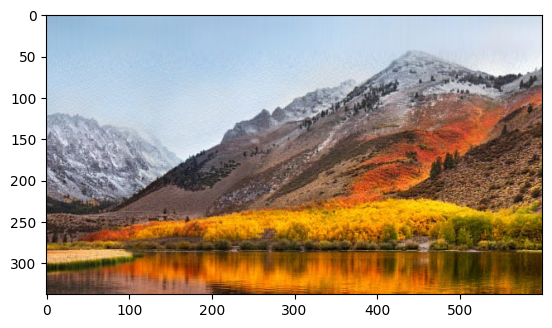

p = 132
Percent of storage memory = 0.6105325443786982
Frobenius norm: ||A - A_p|| = 2168.824112501789


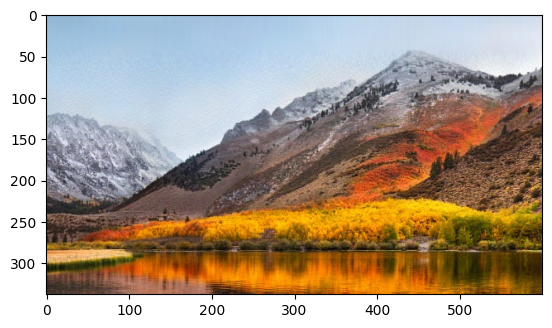

p = 142
Percent of storage memory = 0.6567850098619329
Frobenius norm: ||A - A_p|| = 1959.3909384846247


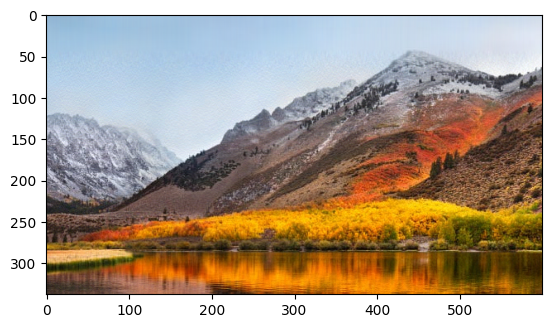

p = 152
Percent of storage memory = 0.7030374753451677
Frobenius norm: ||A - A_p|| = 1763.8882462082304


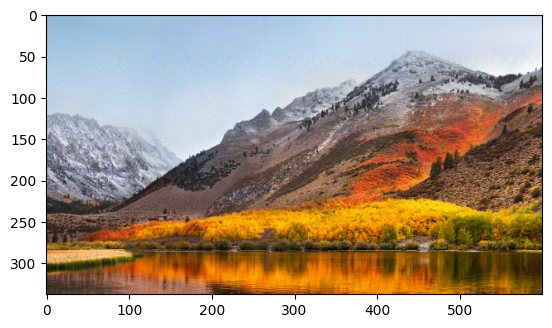

p = 162
Percent of storage memory = 0.7492899408284024
Frobenius norm: ||A - A_p|| = 1577.2316662825986


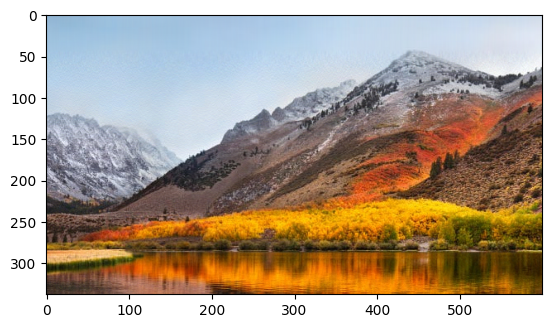

p = 172
Percent of storage memory = 0.7955424063116371
Frobenius norm: ||A - A_p|| = 1402.229106084853


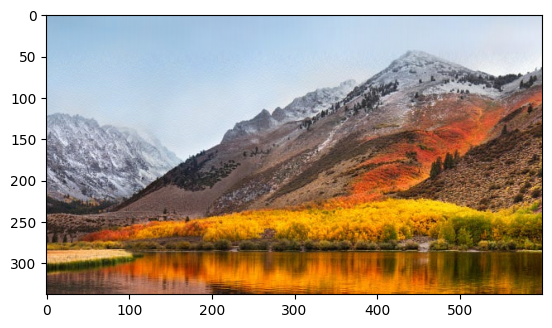

p = 182
Percent of storage memory = 0.8417948717948718
Frobenius norm: ||A - A_p|| = 1240.3104569675513


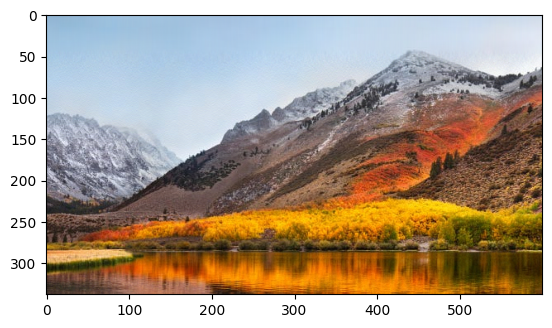

p = 192
Percent of storage memory = 0.8880473372781065
Frobenius norm: ||A - A_p|| = 1088.9837131775387


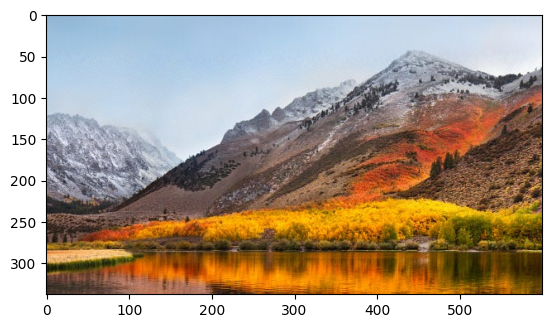

p = 202
Percent of storage memory = 0.9342998027613412
Frobenius norm: ||A - A_p|| = 947.8014003365723


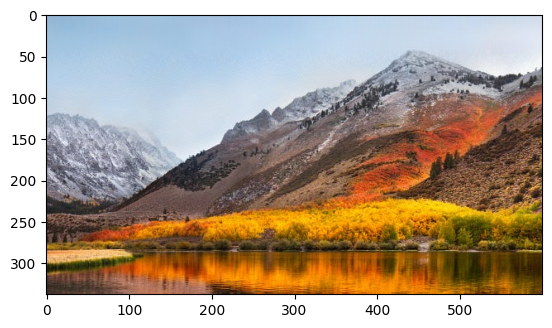

p = 212
Percent of storage memory = 0.980552268244576
Frobenius norm: ||A - A_p|| = 815.7291828705597


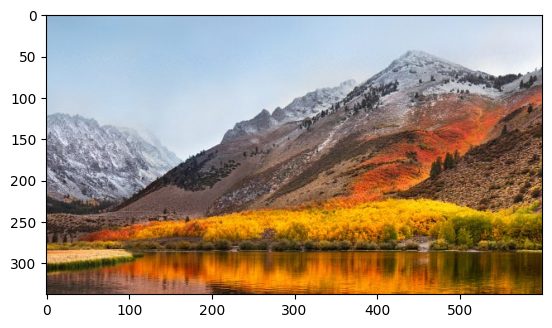

p = 222
Percent of storage memory = 1.0268047337278106
Frobenius norm: ||A - A_p|| = 692.7416506974846


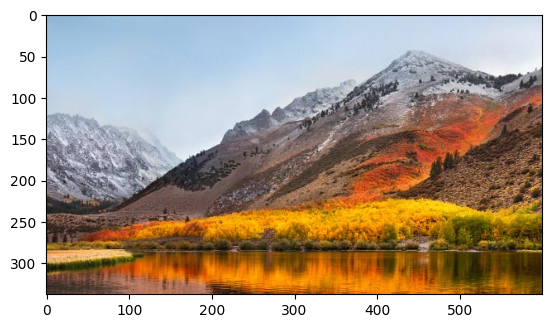

p = 232
Percent of storage memory = 1.0730571992110454
Frobenius norm: ||A - A_p|| = 578.0818260988582


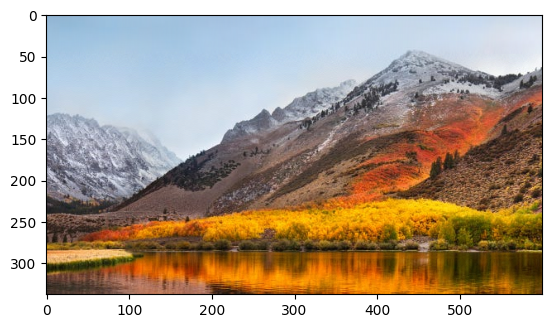

p = 242
Percent of storage memory = 1.1193096646942802
Frobenius norm: ||A - A_p|| = 470.12020697910253


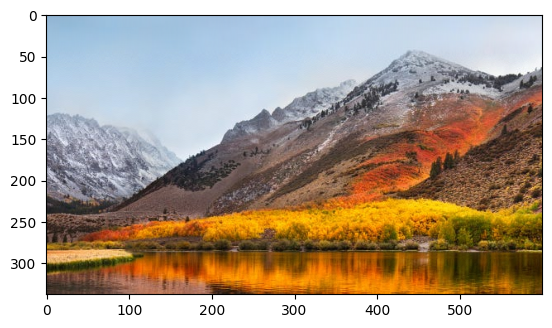

p = 252
Percent of storage memory = 1.1655621301775148
Frobenius norm: ||A - A_p|| = 370.60826740504103


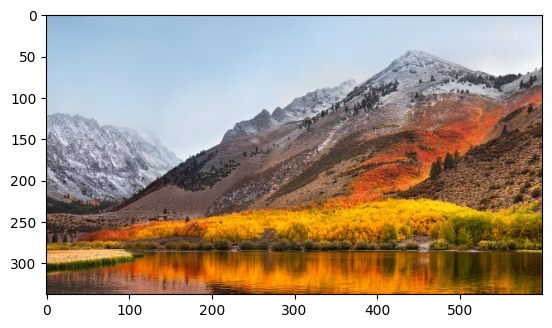

p = 262
Percent of storage memory = 1.2118145956607496
Frobenius norm: ||A - A_p|| = 277.9527131342117


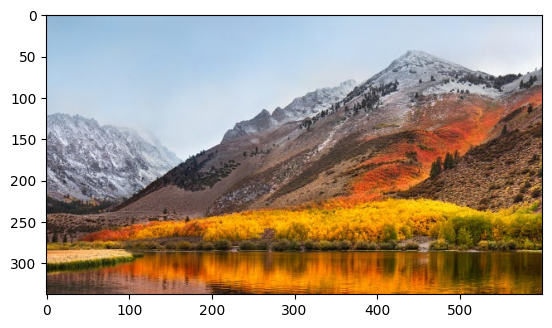

p = 272
Percent of storage memory = 1.2580670611439841
Frobenius norm: ||A - A_p|| = 191.46208668934128


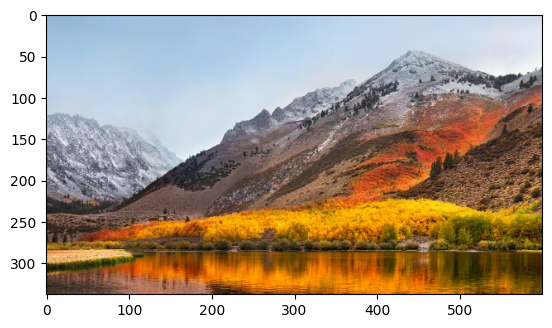

p = 282
Percent of storage memory = 1.304319526627219
Frobenius norm: ||A - A_p|| = 114.86386067306478


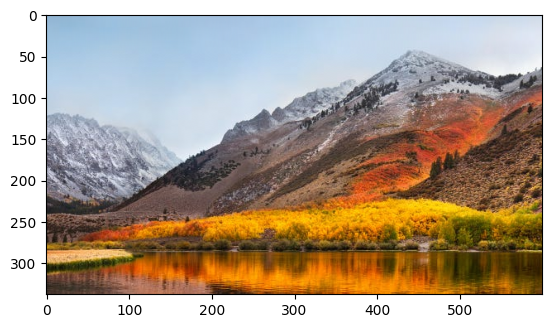

p = 292
Percent of storage memory = 1.3505719921104538
Frobenius norm: ||A - A_p|| = 51.316517273020224


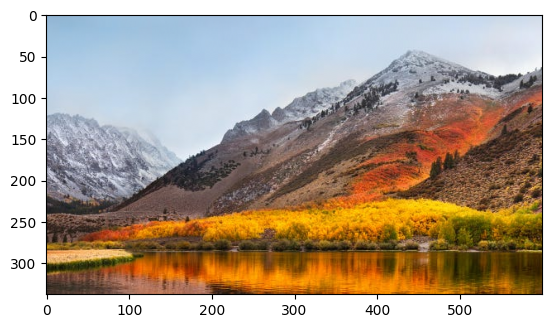

p = 302
Percent of storage memory = 1.3968244575936883
Frobenius norm: ||A - A_p|| = 23.15741163494823


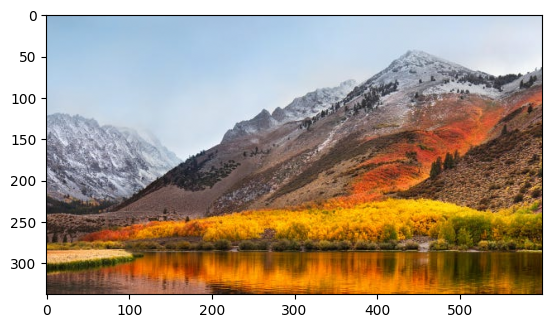

p = 312
Percent of storage memory = 1.4430769230769231
Frobenius norm: ||A - A_p|| = 13.731878398486584


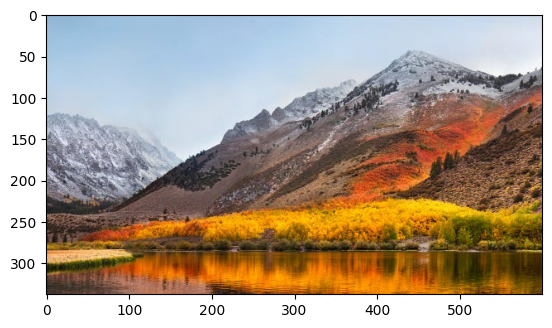

p = 322
Percent of storage memory = 1.4893293885601577
Frobenius norm: ||A - A_p|| = 8.047146094308037


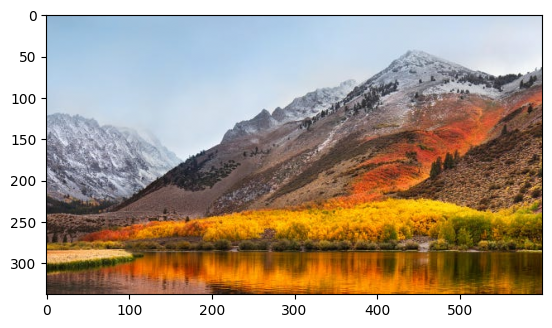

In [ ]:
total_size = decomposed_image.size
for p in range(2,330,10):
  error = []
  reconstituted_image = np.zeros_like(decomposed_image)
  reconstituted_size = 0
  for i in range(3):
    reconstituted_image[:,:,i] = np.real(U[:,:p,i] @ S[:p,:p,i] @ V[:p,:,i])
    reconstituted_size += np.shape(U[:,:p,i])[0] * np.shape(U[:,:p,i])[1] + np.shape(V[:p,:,i])[0] * np.shape(V[:p,:,i])[1]
    #last thing to add is Frobenius norm, seems to not be correct, but not sure. has weird asymptotic behavior
    error.append(np.linalg.norm(decomposed_image[:,:,i] - reconstituted_image[:,:,i], ord='fro'))
  reconstituted_image = norm(reconstituted_image)
  error = np.mean(error)
  plt.imshow(reconstituted_image)
  print("p =", p)
  a = decomposed_image.shape[0]
  b = decomposed_image.shape[1]
  #reconstituted_size = (3*p*(1 + a + b))
  print('Percent of storage memory =', reconstituted_size/total_size)
  print('Frobenius norm: ||A - A_p|| =', error)
  plt.show()

In [ ]:
decomposed_image[:,:,0].shape

(338, 600)

In [ ]:
U[:,:10,0].shape

(338, 10)